# Setup

In [1]:
# Install Git LFS
!curl -s https://packagecloud.io/install/repositories/github/git-lfs/script.deb.sh | sudo bash
!apt-get install git-lfs
!git lfs install

# Clone repo
!rm REM-xarray -rf
!git clone https://github.com/DahnJ/REM-xarray.git

# Change working directory and install requirements
%cd REM-xarray
!pip install -r requirements.txt
!pip install contextily

Detected operating system as Ubuntu/jammy.
Checking for curl...
Detected curl...
Checking for gpg...
Detected gpg...
Detected apt version as 2.4.13
Running apt-get update... done.
Installing apt-transport-https... done.
Installing /etc/apt/sources.list.d/github_git-lfs.list...done.
Importing packagecloud gpg key... Packagecloud gpg key imported to /etc/apt/keyrings/github_git-lfs-archive-keyring.gpg
done.
Running apt-get update... done.

The repository is setup! You can now install packages.
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following packages will be upgraded:
  git-lfs
1 upgraded, 0 newly installed, 0 to remove and 64 not upgraded.
Need to get 8,489 kB of archives.
After this operation, 7,671 kB of additional disk space will be used.
Get:1 https://packagecloud.io/github/git-lfs/ubuntu jammy/main amd64 git-lfs amd64 3.6.1 [8,489 kB]
Fetched 8,489 kB in 0s (19.2 MB/s)
(Reading database ... 124565 files and directories c

In [2]:
from pathlib import Path
from IPython.core.display import Video

import numpy as np
import pandas as pd
import geopandas as gpd  # Vector data handling
import osmnx as ox       # Downloading data from OSM

from shapely.geometry import box
from scipy.spatial import cKDTree as KDTree # For Inverse Distance Weight calculation

import xarray as xr
import xrspatial    # Hillshading
import rioxarray    # Working with geospatial data in xarray

import matplotlib.pyplot as plt
from datashader.transfer_functions import shade, stack
import rasterio
import contextily as ctx

/usr/local/lib/python3.11/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.11/dist-packages/cudf/utils/_ptxcompiler.py:64: UserWarning: Error getting driver and runtime versions:

stdout:



stderr:

Traceback (most recent call last):
  File "<string>", line 4, in <module>
  File "/usr/local/lib/python3.11/dist-packages/numba/cuda/cudadrv/driver.py", line 295, in __getattr__
    raise CudaSupportError("Error at driver init: \n%s:" %
numba.cuda.cudadrv.error.CudaSupportError: Error at driver init: 

CUDA driver library cannot be found.
If you are sure that a CUDA driver is installed,
try setting environment variable NUMBA_CUDA_DRIVER
with the file path of the CUDA driver shared library.
:


Not patching Numba
  warnings.warn

# Download and Load



## Download and Load DEM

- [USGS LidarExplorer](https://prd-tnm.s3.amazonaws.com/LidarExplorer/index.html#/)

In [3]:
# Load the DEM and extract bounding box
dem_file_path = '/content/USGS_1_n34w092_20221121.tif'
dem = rioxarray.open_rasterio(dem_file_path)

In [4]:
# Make the DEM smaller
dem = dem.coarsen(x=2, boundary='trim').mean().coarsen(y=2, boundary='trim').mean()
dem

<xarray.DataArray (band: 1, y: 1806, x: 1806)> Size: 13MB
array([[[68.99731 , 69.33449 , 69.71046 , ..., 47.706894, 47.397156,
         47.31343 ],
        [69.07293 , 69.35483 , 69.45256 , ..., 47.093628, 46.62743 ,
         46.738914],
        [68.94075 , 68.691795, 69.11116 , ..., 46.196037, 46.00306 ,
         46.140877],
        ...,
        [29.846512, 30.311653, 30.363304, ..., 32.69699 , 32.69111 ,
         32.311592],
        [30.005222, 30.173096, 30.272707, ..., 32.418037, 32.746586,
         32.37873 ],
        [29.805475, 29.981026, 30.098331, ..., 32.24141 , 32.526295,
         32.398678]]], dtype=float32)
Coordinates:
  * band         (band) int64 8B 1
  * x            (x) float64 14kB -92.0 -92.0 -92.0 -92.0 ... -91.0 -91.0 -91.0
  * y            (y) float64 14kB 34.0 34.0 34.0 34.0 ... 33.0 33.0 33.0 33.0
    spatial_ref  int64 8B 0
Attributes:
    BandDefinitionKeyword:  *
    DataType:               *
    HighCellSize:           *
    LowCellSize:            *
    MaxCellSize:            *
    AREA_OR_POINT:          Area
    LAYER_TYPE:             *
    RepresentationType:     *
    _FillValue:             -999999.0
    scale_factor:           1.0
    add_offset:             0.0

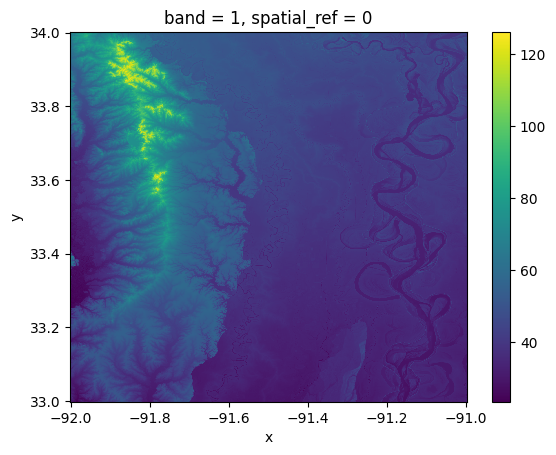

In [5]:
dem.squeeze().plot.imshow()

## Load River from OSM

In [6]:
with rasterio.open(dem_file_path) as dem_raster:
    bounds = dem_raster.bounds  # Get bounding box (left, bottom, right, top)
    bounding_box = (bounds.bottom, bounds.left, bounds.top, bounds.right)  # (ymin, xmin, ymax, xmax)
    print(f"Bounding Box (ymin, xmin, ymax, xmax): {bounding_box}")

Bounding Box (ymin, xmin, ymax, xmax): (32.9983333330178, -92.00166666718229, 34.00166666638444, -90.99833333291633)


In [7]:
# Reorder bbox for OSMnx (left, bottom, right, top)
bbox = (bounding_box[1], bounding_box[0], bounding_box[3], bounding_box[2])  # (xmin, ymin, xmax, ymax)

# Define OSM tags to fetch river features
tags = {'waterway': 'river'}

# Fetch river data from OSM within the bounding box
river = ox.features_from_bbox(bbox, tags)

In [8]:
river.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [9]:
# Set CRS
river = river.to_crs(dem.rio.crs)

In [10]:
river.crs

<Geographic 2D CRS: EPSG:4269>
Name: NAD83
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- undefined
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

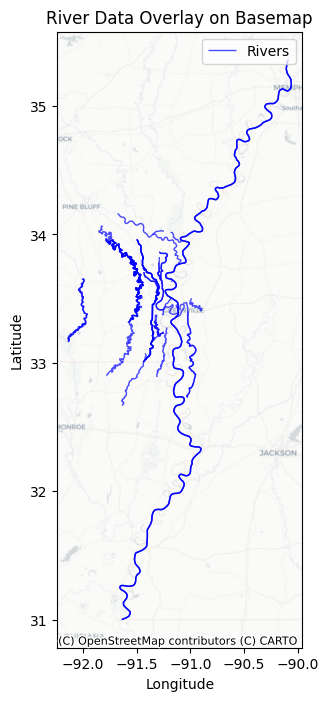

In [11]:
# Plot the river features
fig, ax = plt.subplots(figsize=(10, 8))
river.plot(ax=ax, color='blue', edgecolor='black', linewidth=1, alpha=0.7, label='Rivers')

# Add basemap
ctx.add_basemap(ax, crs=river.crs.to_string(), source=ctx.providers.CartoDB.Positron)

plt.legend()
plt.title('River Data Overlay on Basemap')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

# Cut to Area of Interest

In [12]:
# Define area of interest
xmin, ymin, xmax, ymax = -91.3000, 33.0000, -91.0000, 34.0000
bounds = box(xmin, ymin, xmax, ymax)

In [13]:
# Clip river
river = river.clip(bounds)

In [14]:
# Keep only the row with the longest geometry
river = river.reset_index()
river = river.loc[river['id'] == 27736266] #select particular river segment
river = river[~river.id.duplicated(keep='first')]

# Display the cleaned DataFrame
river

,element,id,geometry,name,ref,waterway,alt_name,source,alt_name:dak,alt_name:es,...,name:en,name:kk,name:ug,lock,tunnel,layer,admin_level,border_type,boundary,created_by
7,way,27736266,"LINESTRING (-91.0194 34, -91.0354 33.98978, -9...",Mississippi River,M 55,river,NaN,NaN,Mníšošethąka,Río Misisipi,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


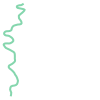

In [15]:
river.geometry.iloc[0]

In [16]:
# Clip DEM
dem = dem.sel(y=slice(ymax, ymin), x=slice(xmin, xmax))
dem

<xarray.DataArray (band: 1, y: 1800, x: 540)> Size: 4MB
array([[[48.17179 , 48.025993, 47.806465, ..., 47.889366, 47.279297,
         45.99857 ],
        [48.2753  , 48.102325, 47.987465, ..., 47.433212, 46.180084,
         45.18003 ],
        [48.358276, 48.159767, 48.033627, ..., 46.23256 , 45.02488 ,
         44.754913],
        ...,
        [35.833054, 35.951687, 35.483017, ..., 32.50476 , 32.734123,
         32.592144],
        [35.51591 , 35.08661 , 34.457245, ..., 32.394104, 32.613342,
         32.57232 ],
        [34.382233, 33.843483, 33.65237 , ..., 32.32584 , 32.505936,
         32.57345 ]]], dtype=float32)
Coordinates:
  * band         (band) int64 8B 1
  * x            (x) float64 4kB -91.3 -91.3 -91.3 -91.3 ... -91.0 -91.0 -91.0
  * y            (y) float64 14kB 34.0 34.0 34.0 34.0 ... 33.0 33.0 33.0 33.0
    spatial_ref  int64 8B 0
Attributes:
    BandDefinitionKeyword:  *
    DataType:               *
    HighCellSize:           *
    LowCellSize:            *
    MaxCellSize:            *
    AREA_OR_POINT:          Area
    LAYER_TYPE:             *
    RepresentationType:     *
    _FillValue:             -999999.0
    scale_factor:           1.0
    add_offset:             0.0

<Axes: title={'center': 'band = 1, spatial_ref = 0'}, xlabel='x', ylabel='y'>

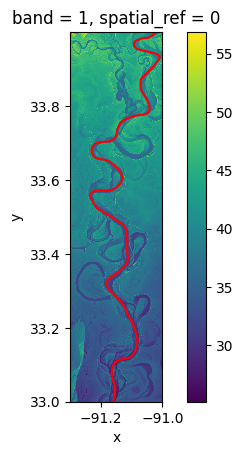

In [17]:
# PLot river and DEM
fig, ax = plt.subplots()
dem.squeeze().plot.imshow(ax=ax)
river.plot(ax=ax, color='red')

#  REM Calculation

To calculate the REM, we need to

- Sample the elevation along the river
- Interpolate the sampled elevation values to create a 2D elevation raster
- Subtract the interpolated elevation raster from the DEM

## Sample

In [18]:
# Check if the geometry is of type LineString or MultiLineString
for river_geom in river.geometry:
    if river_geom.geom_type == 'LineString':
        x, y = river_geom.xy  # Extract coordinates
        print(f"LineString: X-coordinates {x}, Y-coordinates {y}")

    elif river_geom.geom_type == 'MultiLineString':
        for line in river_geom.geoms:
            x, y = line.xy
            print(f"MultiLineString Part: X-coordinates {x}, Y-coordinates {y}")

    else:
        print(f"Geometry Type: {river_geom.geom_type}, WKT: {river_geom.wkt[:100]}")


LineString: X-coordinates array('d', [-91.0193959629276, -91.0354028, -91.0458742, -91.0652719, -91.0791765, -91.0886178, -91.0923944, -91.0918794, -91.084498, -91.0785353, -91.0736833, -91.0513673, -91.0213266, -91.0136018, -91.0093103, -91.0117135, -91.0194383, -91.0340295, -91.0496507, -91.0625253, -91.0704217, -91.0713446, -91.0688768, -91.0587488, -91.0498224, -91.0446725, -91.0422693, -91.0420976, -91.0470758, -91.0599504, -91.0748849, -91.0853563, -91.0958276, -91.1114488, -91.1146441, -91.1239801, -91.1313615, -91.1394296, -91.1476694, -91.1492143, -91.1517892, -91.1564241, -91.168612, -91.1854349, -91.201056, -91.2141023, -91.2206254, -91.2269769, -91.2304101, -91.2295518, -91.2223421, -91.212729, -91.2062059, -91.1866365, -91.1730752, -91.1555658, -91.1471544, -91.1378847, -91.1317048, -91.1311899, -91.1409746, -91.1533342, -91.1650072, -91.1768518, -91.1857388, -91.1895547, -91.2159906, -91.2245737, -91.2295518, -91.2329851, -91.2347017, -91.2335, -91.226911, -91.2216554, -9

In [19]:
# Extract coordinates as DataArray
xs, ys = river_geom.xy
xs, ys = xr.DataArray(xs, dims='z'), xr.DataArray(ys, dims='z')

In [20]:
# Use xarray's interp to extract the river's elevation
sampled = dem.interp(x=xs, y=ys, method='nearest').dropna(dim='z')
sampled

<xarray.DataArray (band: 1, z: 116)> Size: 464B
array([[38.963238, 38.9     , 38.9     , 38.780636, 38.834946, 40.353165,
        40.048157, 38.60021 , 38.63938 , 39.003567, 38.482468, 38.14002 ,
        38.      , 37.968597, 37.70011 , 37.725494, 37.232758, 37.120716,
        36.974213, 36.8     , 36.5     , 36.5     , 36.2     , 36.504456,
        36.289215, 36.803684, 36.7525  , 35.934875, 35.96597 , 35.845856,
        35.728947, 35.633675, 35.6     , 35.6     , 35.6     , 35.6     ,
        35.6     , 35.423454, 35.543976, 35.331257, 35.3     , 35.3     ,
        35.61969 , 35.585045, 35.313034, 35.545418, 35.373497, 35.48652 ,
        35.43397 , 35.265095, 35.069565, 35.      , 35.      , 35.      ,
        34.814316, 34.755833, 34.699272, 34.443596, 34.266663, 34.1     ,
        34.1     , 34.1     , 34.1     , 34.1     , 34.097248, 34.178535,
        34.024734, 33.800842, 33.807716, 33.86585 , 33.80504 , 33.769585,
        33.68552 , 33.55878 , 33.49996 , 33.5     , 33.2     , 33.171112,
        32.8     , 32.8     , 32.78354 , 32.6     , 32.29998 , 32.269966,
        32.157017, 32.      , 31.849325, 31.7     , 31.7     , 32.484303,
        32.06813 , 31.538216, 31.43676 , 31.98389 , 31.3     , 31.3     ,
        31.3     , 31.057758, 30.8     , 31.090849, 30.549707, 31.29155 ,
        31.17715 , 29.599869, 29.3     , 29.303715, 29.      , 29.      ,
        28.7     , 28.7     , 28.46679 , 28.4     , 28.406553, 28.733   ,
        28.577461, 27.8     ]], dtype=float32)
Coordinates:
  * band         (band) int64 8B 1
    spatial_ref  int64 8B 0
    x            (z) float64 928B -91.04 -91.05 -91.07 ... -91.16 -91.15 -91.16
    y            (z) float64 928B 33.99 33.98 33.98 33.98 ... 33.06 33.04 33.02
Dimensions without coordinates: z
Attributes:
    BandDefinitionKeyword:  *
    DataType:               *
    HighCellSize:           *
    LowCellSize:            *
    MaxCellSize:            *
    AREA_OR_POINT:          Area
    LAYER_TYPE:             *
    RepresentationType:     *
    _FillValue:             -999999.0
    scale_factor:           1.0
    add_offset:             0.0

## Interpolate

In [21]:
# Sampled river coordinates
c_sampled = np.vstack([sampled.coords[c].values for c in ('x', 'y')]).T

# All (x, y) coordinates of the original DEM
c_x, c_y = [dem.coords[c].values for c in ('x', 'y')]
c_interpolate = np.dstack(np.meshgrid(c_x, c_y)).reshape(-1, 2)

# Sampled values
values = sampled.values.ravel()

In [22]:
tree = KDTree(c_sampled)

# IWD interpolation
distances, indices = tree.query(c_interpolate, k=10)

weights = 1 / distances
weights = weights / weights.sum(axis=1).reshape(-1, 1)

interpolated_values = (weights * values[indices]).sum(axis=1)

In [23]:
# create a DataArray out of the inerpolated values
elevation_raster = xr.DataArray(
    interpolated_values.reshape((len(c_y), len(c_x))).T, dims=('x', 'y'), coords={'x': c_x, 'y': c_y}
)

<Axes: xlabel='x', ylabel='y'>

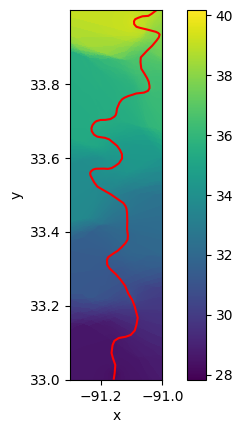

In [24]:
# Plot
fig, ax = plt.subplots()
elevation_raster.transpose().plot.imshow(ax=ax)
river.plot(ax=ax, color='red')

## Calculate REM

In [25]:
# Calculate REM
rem = dem - elevation_raster

In [26]:
# Example NumPy array (replace with your flipped raster data)
rem_mirrored = np.flipud(rem.squeeze())

# Define coordinate values (assuming 2D raster with lat/lon)
x_coords = np.linspace(-91.2, -91.0, rem_mirrored.shape[1])  # Example x coordinates
y_coords = np.linspace(33.0, 33.8, rem_mirrored.shape[0])  # Example y coordinates

# Convert to xarray DataArray
rem_xarray = xr.DataArray(
    rem_mirrored,
    coords=[("y", y_coords), ("x", x_coords)],
    dims=["y", "x"],
    attrs={'description': 'Mirrored Raster Data', 'units': 'meters'}
)

# Visualize REM

In [42]:
# set colors
colors = ['#ffffff', '#BFD7EA', '#39CCCC', '#0074D9', '#001f3f', '#0c0c0c'] #BFD7EA #'#7FDBFF'

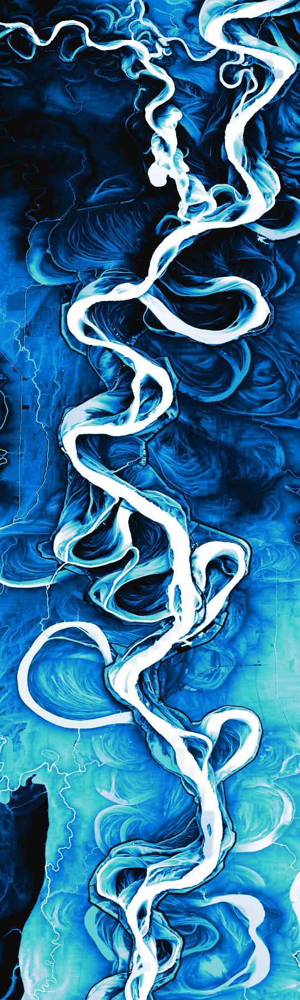

In [44]:
# Final viz
final_viz = shade(rem_xarray.squeeze(), cmap=colors, span=[0, 9], how='linear')
final_viz.to_pil().save("day28_mississippi_rem.png")
final_viz

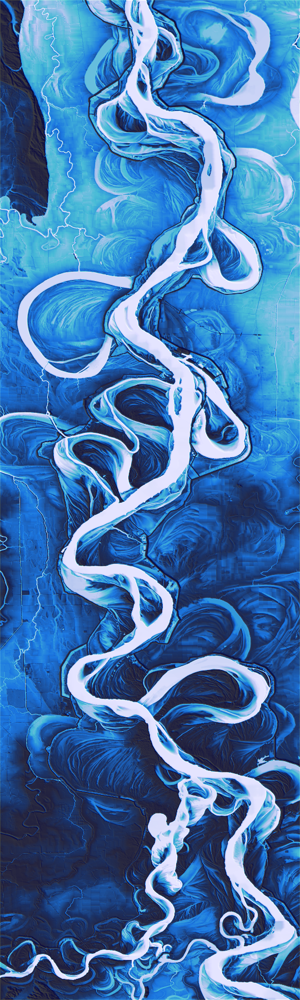

In [29]:
# Overlay with DEM
a = shade(xrspatial.hillshade(dem.squeeze(), angle_altitude=2, azimuth=310), cmap=['blue', 'white'], how='linear')
b = shade(rem.squeeze(), cmap=colors, span=[0, 9], how='linear', alpha=200)
stack(a, b)

# References

- This code is edited from the original version from Daniel Jahn https://github.com/DahnJ/REM-xarray
- https://dancoecarto.com/4k-rivers